In [1]:
import tribolium_clustering as tc
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

lund_folder = tc.get_folder_path('lund')
finster_folder = tc.get_folder_path('finsterwalde')
location_lf_embeddings = tc.get_folder_path('more serious code')

lund = tc.processed_dataset(lund_folder)
finster = tc.processed_dataset(finster_folder)

embedding_lund = np.load(location_lf_embeddings+'lund embryo serosa embedding.npy')
pred_lund = np.load(location_lf_embeddings+'lund embryo serosa presdiction.npy')


embedding_finster = np.load(location_lf_embeddings+'finsterwalde embryo serosa embedding.npy')
pred_finster = np.load(location_lf_embeddings+'finsterwalde embryo serosa presdiction.npy')


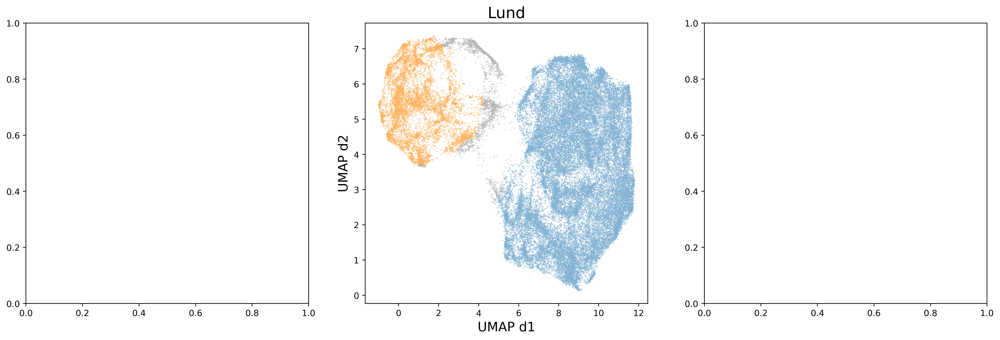

In [2]:
#tc.plot_predictions_onto_scatter_plot(datax=embedding_lund[:,0],datay=embedding_lund[:,1],prediction=pred_lund)

cmap_plots = tc.data_visualisation.plot_cmap()

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 400

spot_size = 0.25
font_size_title = 18
font_size_axis = 15

fig, axs = plt.subplots(1,3, figsize = (20,6))
axs[1].scatter(embedding_lund[:,0],embedding_lund[:,1], s = spot_size, c = [cmap_plots[j] for j in pred_lund], alpha = 0.5)
axs[1].set_title('Lund', fontsize = font_size_title)
axs[1].set_xlabel('UMAP d1', fontsize =font_size_axis)
axs[1].set_ylabel('UMAP d2', fontsize =font_size_axis)
plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


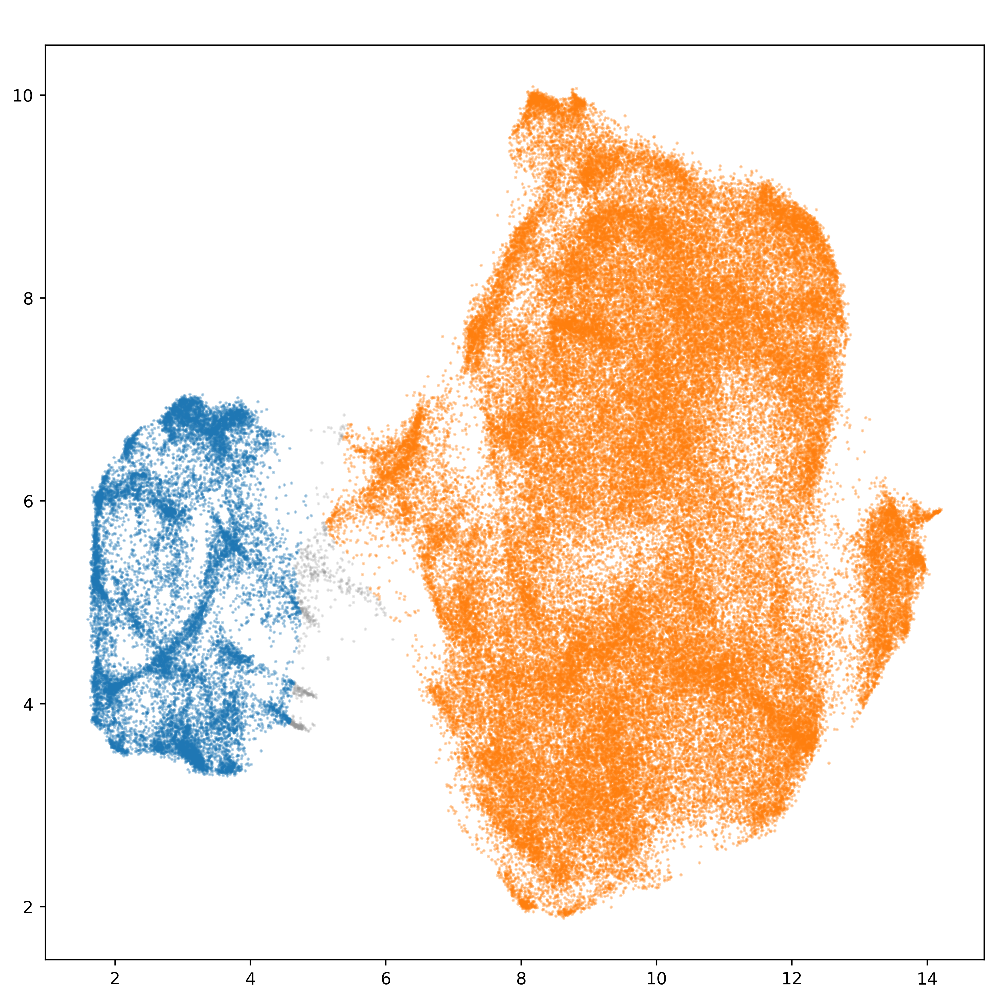

In [3]:
tc.plot_predictions_onto_scatter_plot(datax=embedding_finster[:,0],datay=embedding_finster[:,1],prediction=pred_finster)

In [4]:
wolgast_folder = tc.get_folder_path('wolgast')
wolgast = tc.processed_dataset(wolgast_folder)
location_wolgast_predictions = tc.get_folder_path('wolgast embryo serosa clustering')

In [5]:
regprops_w_predictions = pd.concat([pd.read_csv(location_wolgast_predictions+'regprops with embryo serosa clustering UMAP(nn 400, mindist 0), hdbscan(mincl size 2000) t{}.csv'.format(i))
                                    for i in range(32)],axis = 0)

regprops_w_predictions

,Unnamed: 0,area,bbox_area,convex_area,equivalent_diameter,euler_number,extent,feret_diameter_max,filled_area,major_axis_length,...,weighted_centroid-2,image_stdev,avg distance of 4 closest points,stddev distance of 4 closest points,avg distance of 5 closest points,stddev distance of 5 closest points,avg distance of 6 closest points,stddev distance of 6 closest points,touching neighbor count,prediction
0,0,12620,23925,14822,28.885967,1,0.527482,41.412558,12620,41.721707,...,57.854736,57.301899,21.922253,4.958887,23.760954,5.470745,24.991463,5.836930,6.0,0
1,1,2477,5250,3214,16.787105,1,0.471810,29.899833,2477,32.204734,...,57.266481,39.233257,18.946156,4.278524,19.953463,4.672392,21.545479,4.923704,3.0,1
2,2,4834,15950,6312,20.978254,1,0.303072,34.799425,4834,37.199328,...,58.591143,31.246256,27.788269,2.634942,29.959540,2.931475,32.852234,3.260478,3.0,0
3,3,7378,19136,9702,24.153497,1,0.385556,37.336309,7378,39.755807,...,57.201720,61.405415,25.120953,3.142546,27.046331,3.471131,29.445578,3.837890,5.0,0
4,4,3813,11400,5145,19.383077,0,0.334474,32.388269,3813,32.584607,...,55.828732,72.473846,14.103435,1.790113,15.400334,1.895167,16.455456,1.995997,5.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2031,2031,10327,27380,15214,27.018331,1,0.377173,51.166395,10327,42.680571,...,504.247901,133.471039,41.350650,4.962381,44.162758,5.395065,47.252020,5.807133,4.0,0
2032,2032,16144,31365,19081,31.357217,1,0.514714,52.392748,16144,55.453004,...,505.134052,148.745148,40.184612,3.454075,41.648743,3.512970,43.413250,3.674462,5.0,0
2033,2033,7703,12376,8545,24.503066,1,0.622414,38.236109,7703,41.385829,...,505.909694,105.442490,59.616730,4.105003,66.104090,5.912597,71.953910,6.892155,1.0,0
2034,2034,8561,22230,10729,25.380994,1,0.385110,50.576674,8561,47.538965,...,506.065514,37.718227,43.007570,6.292582,47.315570,7.176403,51.804256,7.948788,3.0,0


In [6]:
pred_wolgast = regprops_w_predictions['prediction'].to_numpy()

In [7]:
def dataset_to_unit_props(dataset):
    combined_thesis_props = dataset.get_combined_thesis_props_no_correlation()
    
    # conversion factors for measurements with units
    volume_cf = 0.69*0.69*0.69
    distance_cf = 0.69

    conversion_factors = [volume_cf,volume_cf,1,distance_cf,1,
                     1,1,1,1,
                     1,1,1,
                     distance_cf,
                     distance_cf,1,
                     1]

    regionprops_w_units = combined_thesis_props * conversion_factors
    
    return regionprops_w_units

def props_predictions_to_cluster_dataframes(regionprops,predictions):
    predictions_df = pd.DataFrame({'prediction':predictions})
    regprops_w_predictions = pd.concat([regionprops,predictions_df],axis = 1)

    cluster_regprops_list = [regprops_w_predictions[regprops_w_predictions['prediction']==i] for i in [0,1]]
    
    return cluster_regprops_list

lund_unit_props = dataset_to_unit_props(lund)
wolgast_unit_props = dataset_to_unit_props(wolgast)
finster_unit_props = dataset_to_unit_props(finster)

prediction_df_lund = props_predictions_to_cluster_dataframes(lund_unit_props,pred_lund)
prediction_df_finset = props_predictions_to_cluster_dataframes(finster_unit_props,pred_finster)
prediction_df_wolgast = props_predictions_to_cluster_dataframes(wolgast_unit_props,pred_wolgast)

No Predictions in Regionprops of D:/Uni/MSTER TUD/Master Thesis/output data/Lund Gastrulation Correct voxel sizes//
No Predictions in Regionprops of D:/Uni/MSTER TUD/Master Thesis/output data/Wolgast Gastrulation Labels//
No Predictions in Regionprops of D:/Uni/MSTER TUD/Master Thesis/output data/Finsterwalde Gastrulation Labels (new timeframe)//


In [8]:
import seaborn as sns

plot_cmap = tc.plot_cmap()

def plot_cluster_comparison(measurements,x_axis_title,names,
                            kwargs = dict(hist_kws={'alpha':0.3}, kde_kws={'linewidth':0.5})):
    
    # Renaming X-Axis
    new_name_props = [prop.rename(x_axis_title) for prop in measurements]
    
    
    kwargs = dict(hist_kws={'alpha':0.3}, kde_kws={'linewidth':1})
    plt.figure(figsize =(4,3), dpi = 400)
    
    for i,Area, name in zip(range(5),new_name_props, names):
        sns.distplot(Area, label = name,color=plot_cmap[i] ,**kwargs)
    plt.legend()
    


# Lund

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


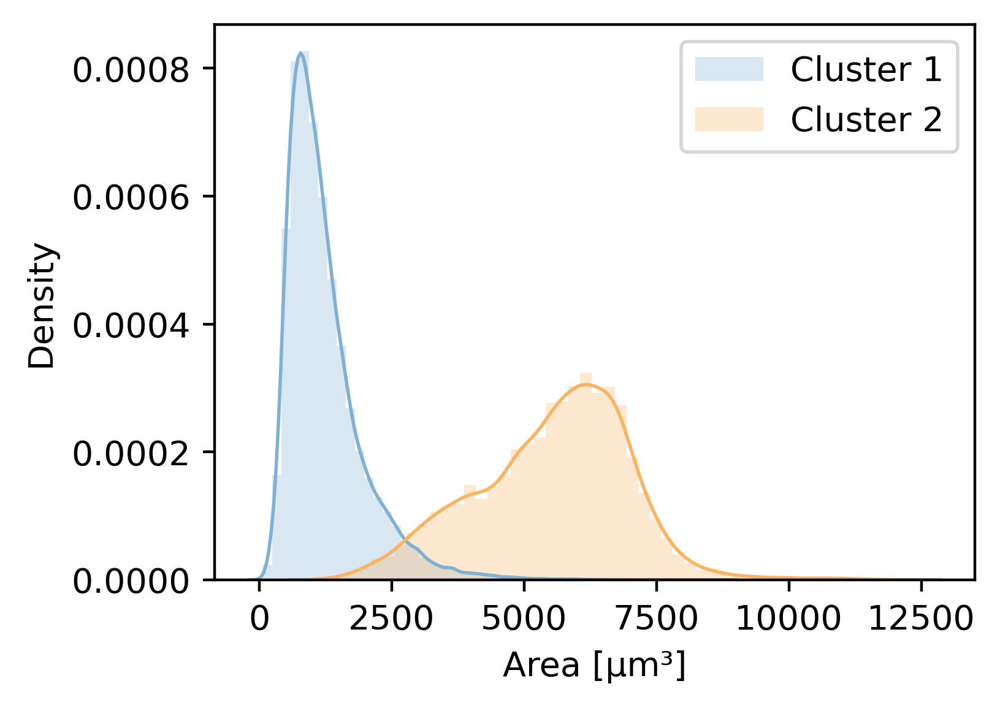

In [9]:
cluster_regprops_list = prediction_df_lund

areas = [prop['area'] for prop in cluster_regprops_list]

names = ['Cluster {}'.format(i+1) for i in range(2)]

plot_cluster_comparison(areas,'Area [\u03BCm\u00b3]',names)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


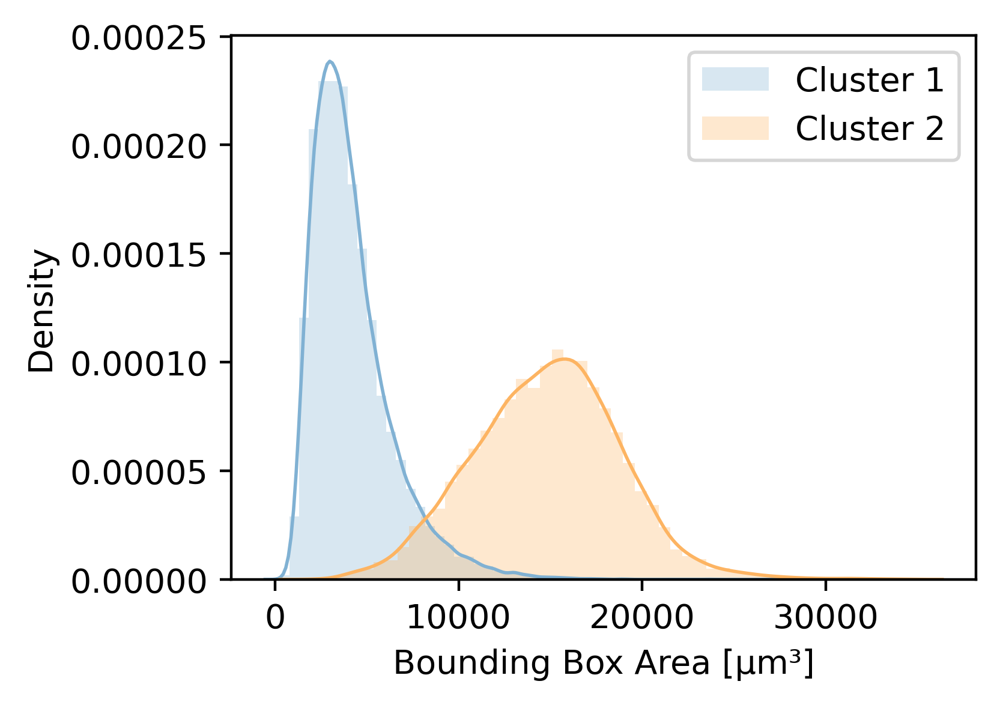

In [10]:
bbox_area = [prop['bbox_area'] for prop in cluster_regprops_list]

plot_cluster_comparison(bbox_area, 'Bounding Box Area [\u03BCm\u00b3]',names)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


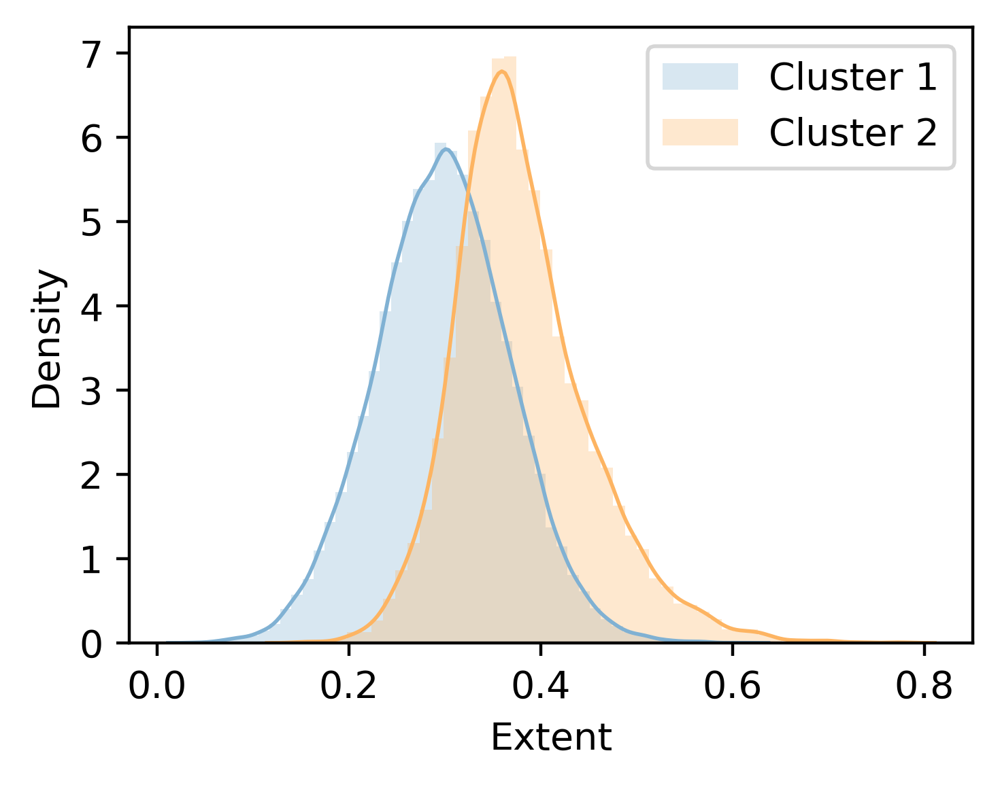

In [11]:
extent = [prop['extent'] for prop in cluster_regprops_list]
plot_cluster_comparison(extent, 'Extent',names)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


(10.0, 55.0)

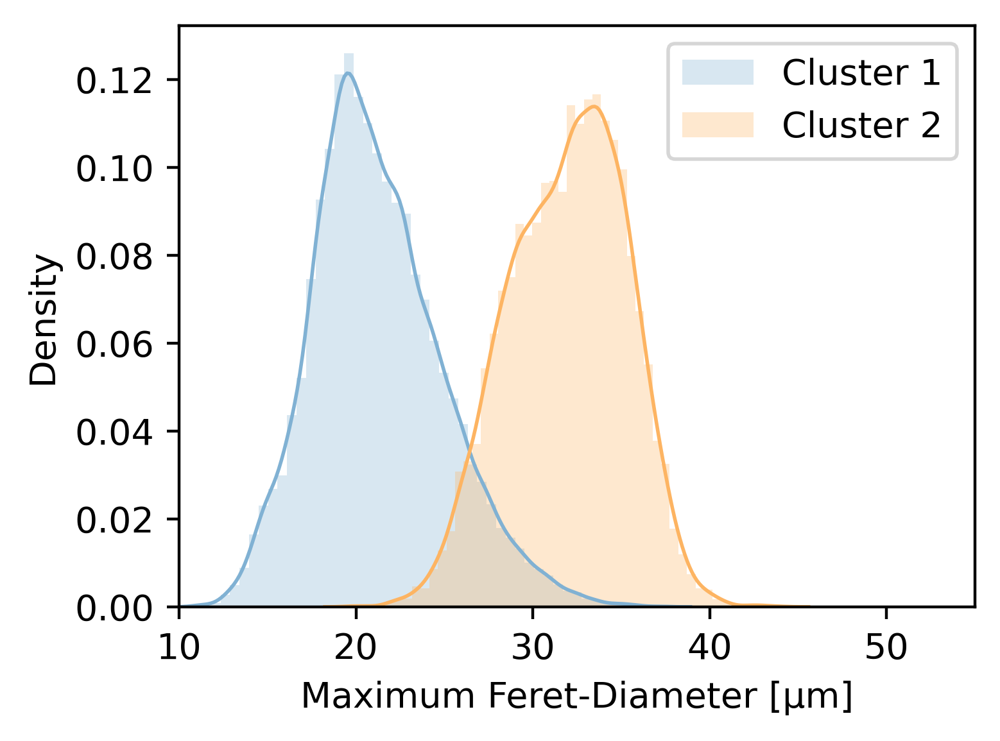

In [12]:
feret_diam = [prop['feret_diameter_max'] for prop in cluster_regprops_list]

plot_cluster_comparison(feret_diam, 'Maximum Feret-Diameter [\u03BCm]',names)
plt.xlim([10,55])

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


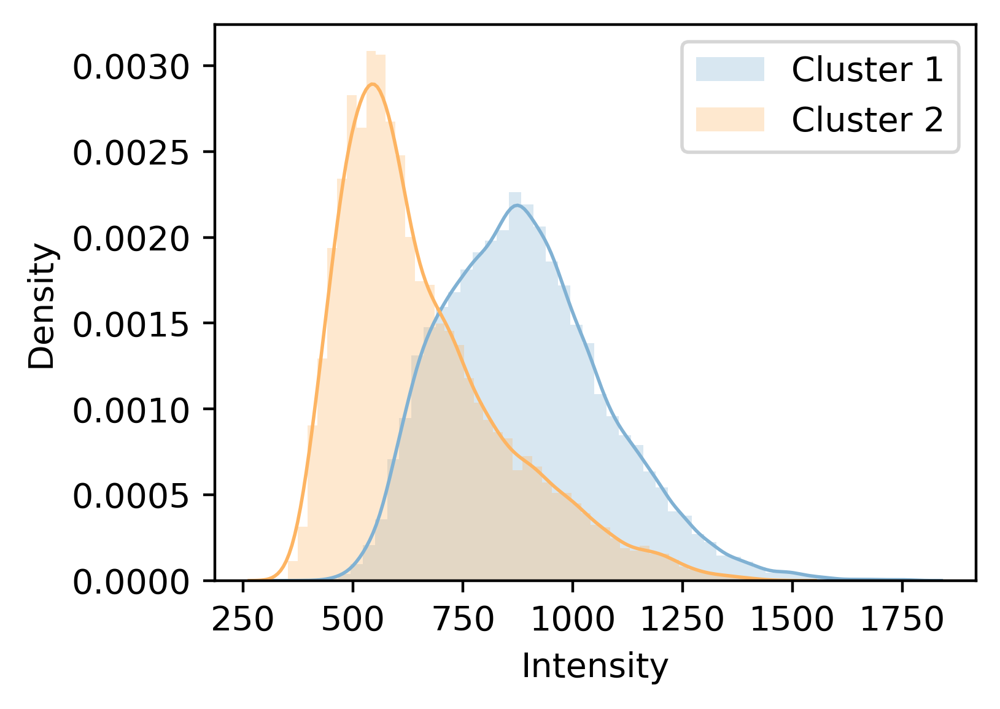

In [13]:
max_int = [prop['max_intensity'] for prop in cluster_regprops_list]

plot_cluster_comparison(max_int, 'Intensity',names)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


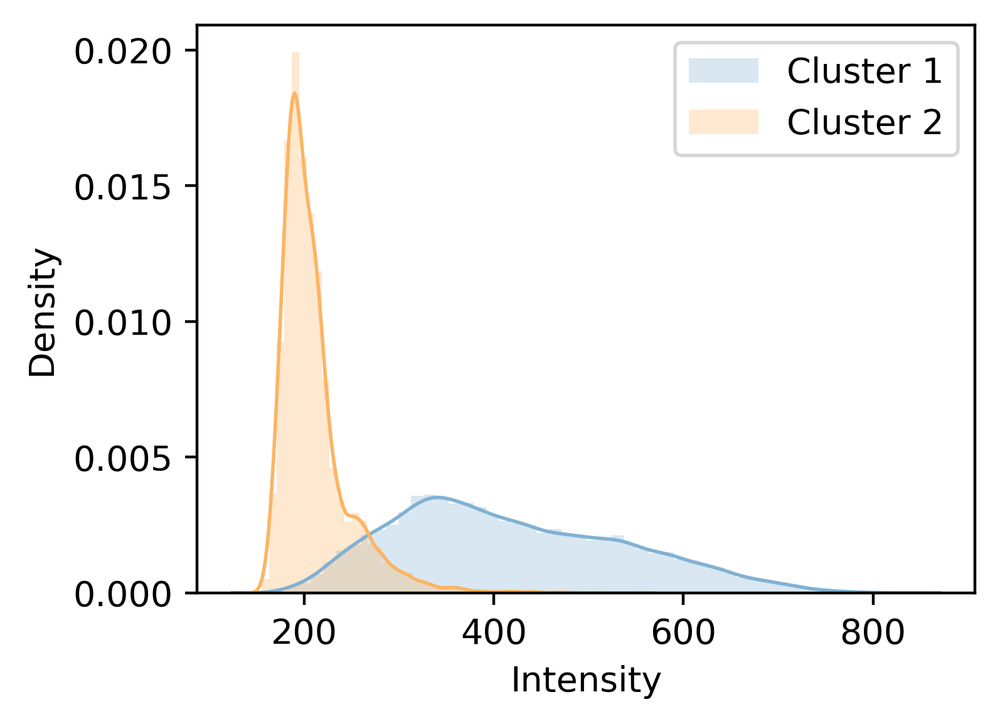

In [14]:
min_int = [prop['min_intensity'] for prop in cluster_regprops_list]

plot_cluster_comparison(min_int, 'Intensity',names)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


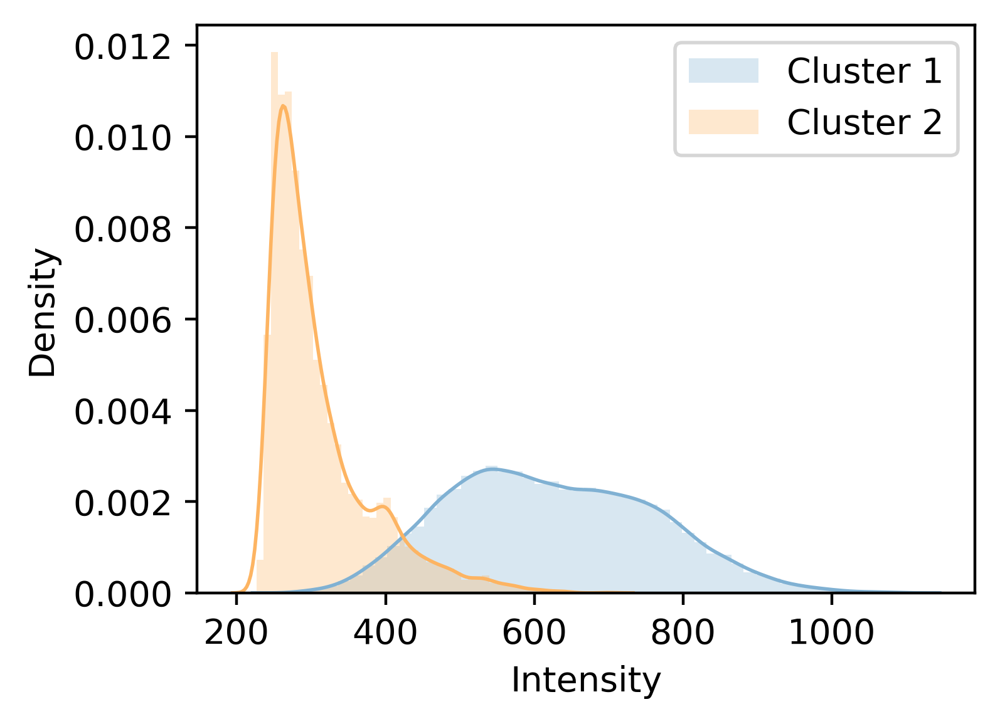

In [15]:
mean_int = [prop['mean_intensity'] for prop in cluster_regprops_list]

plot_cluster_comparison(mean_int, 'Intensity',names)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


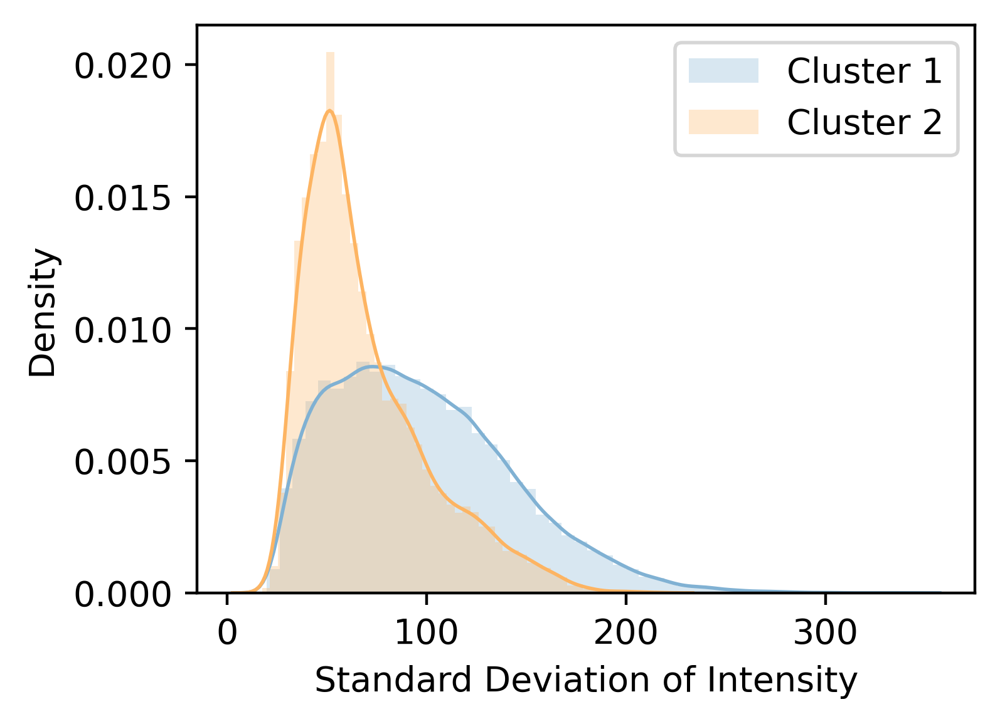

In [16]:
stdev_int = [prop['image_stdev'] for prop in cluster_regprops_list]

plot_cluster_comparison(stdev_int, 'Standard Deviation of Intensity',names)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


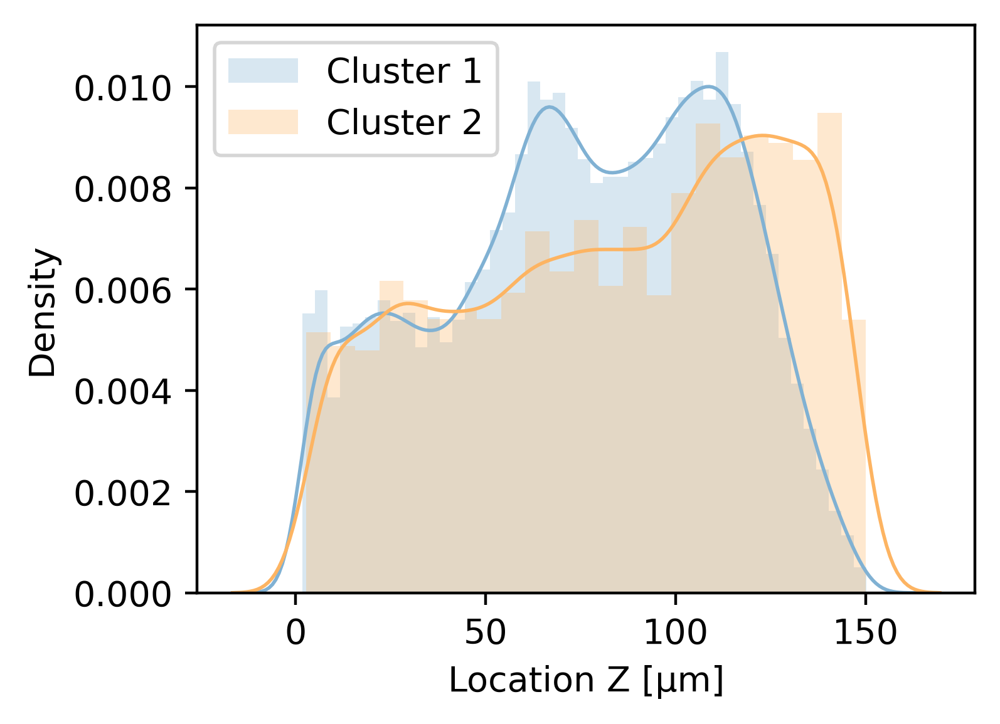

In [17]:
distance_cf = 0.69

cent_0 = [prop['centroid-0']*distance_cf for prop in cluster_regprops_list]

plot_cluster_comparison(cent_0, 'Location Z [\u03BCm]',names)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


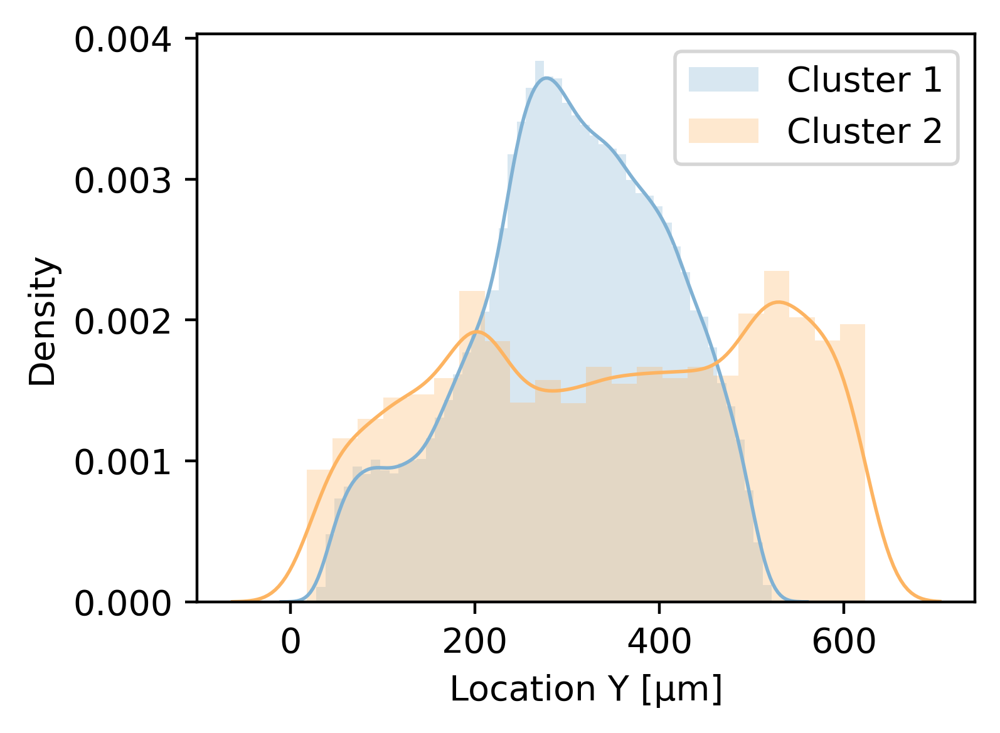

In [18]:
cent_1 = [prop['centroid-1']*distance_cf for prop in cluster_regprops_list]

plot_cluster_comparison(cent_1, 'Location Y [\u03BCm]',names)


C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


(0.0, 550.0)

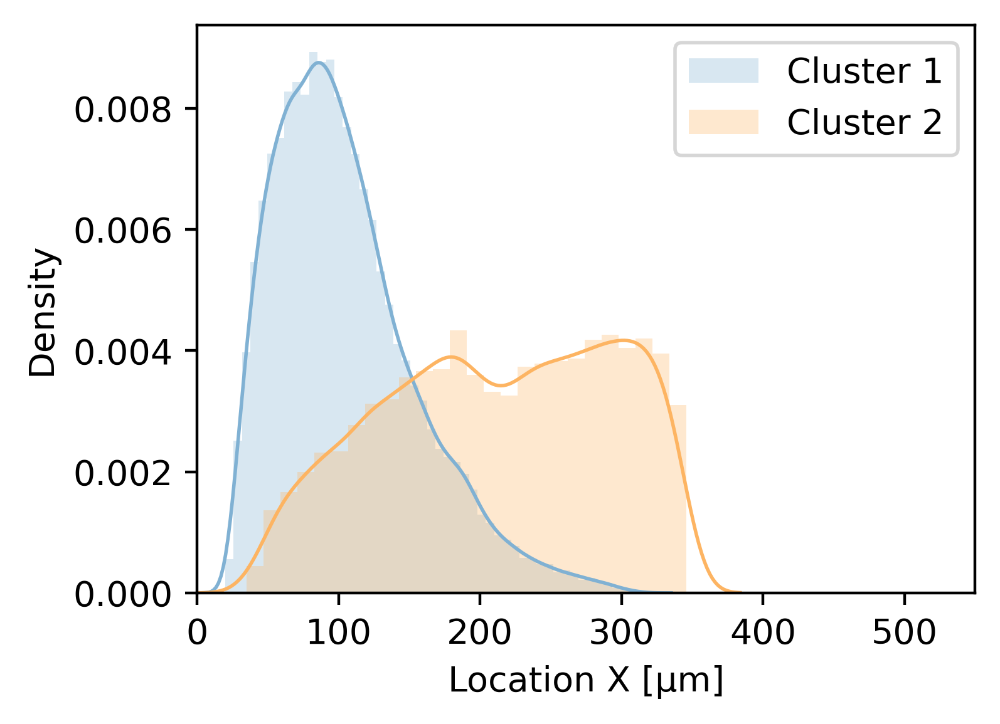

In [19]:
cent_2 = [prop['centroid-2']*distance_cf for prop in cluster_regprops_list]

plot_cluster_comparison(cent_2, 'Location X [\u03BCm]',names)
plt.xlim([0,550])

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


(5.0, 45.0)

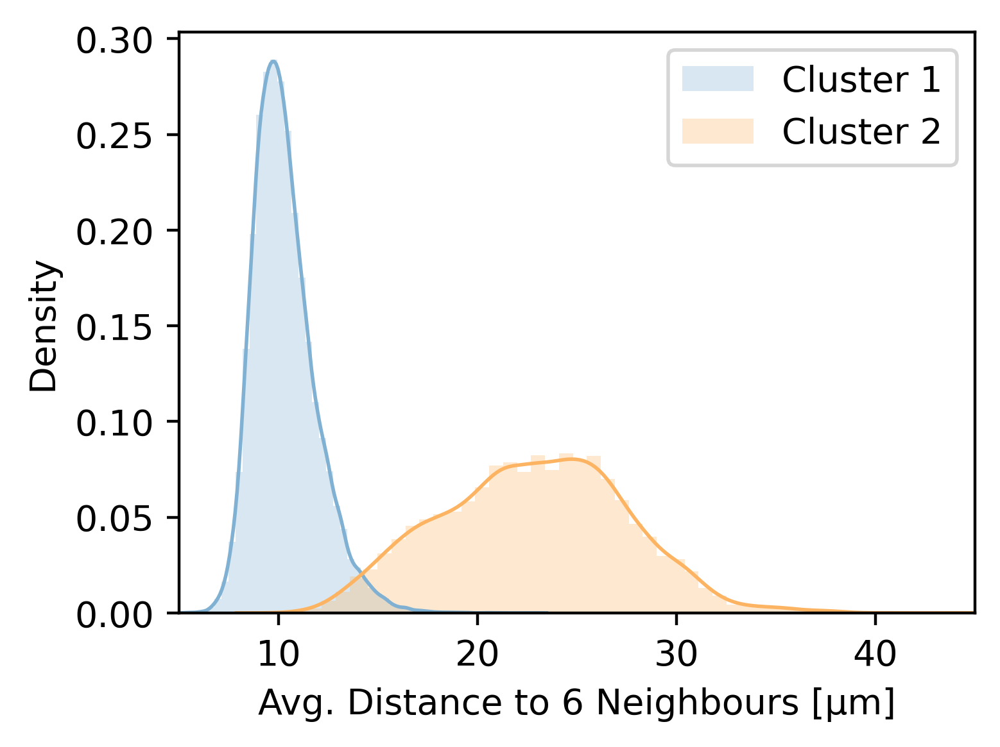

In [20]:
avg_dist = [prop['avg distance of 6 closest points'] for prop in cluster_regprops_list]

plot_cluster_comparison(avg_dist, 'Avg. Distance to 6 Neighbours [\u03BCm]',names)
plt.xlim([5,45])

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


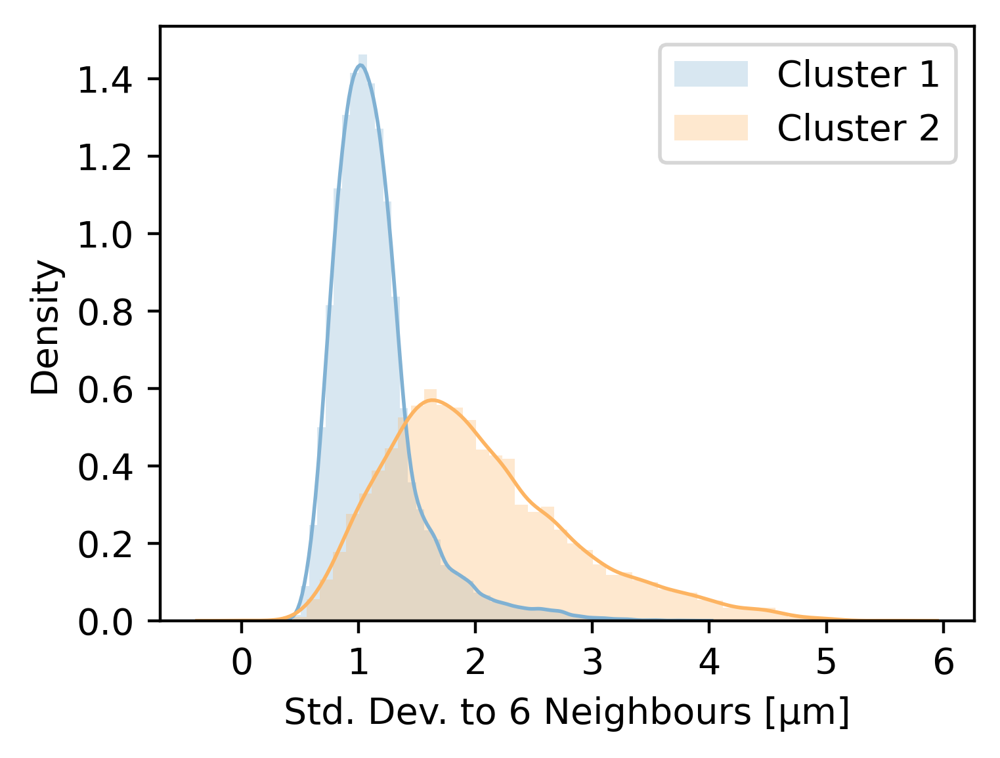

In [21]:
stdev_dist = [prop['stddev distance of 6 closest points'] for prop in cluster_regprops_list]

plot_cluster_comparison(stdev_dist, 'Std. Dev. to 6 Neighbours [\u03BCm]',names)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:1657: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.2 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histo

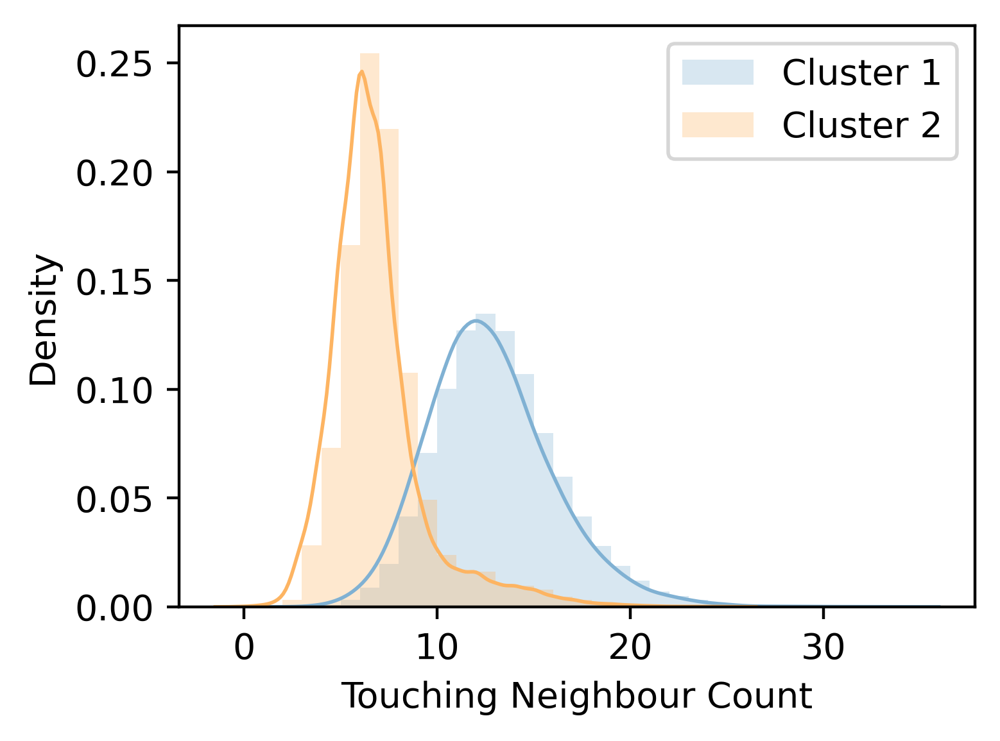

In [22]:
def plot_cluster_comparison_tnc(measurements,x_axis_title,names,
                            kwargs = dict(hist_kws={'alpha':0.3}, kde_kws={'linewidth':1}),
                            bins = None):
    
    # Renaming X-Axis
    new_name_props = [prop.rename(x_axis_title) for prop in measurements]
    
    
    
    plt.figure(figsize =(4,3), dpi = 400)
    
    for i,Area, name in zip(range(5),new_name_props, names):
        sns.distplot(Area, bins=bins ,label = name,color=plot_cmap[i] ,**kwargs)
    plt.legend()


tnc = [prop['touching neighbor count'] for prop in cluster_regprops_list]

plot_cluster_comparison_tnc(tnc, 'Touching Neighbour Count',names, bins = range(31), 
                        kwargs = dict(hist_kws={'alpha':0.3}, 
                                      kde_kws={'linewidth':1, 
                                               'bw':0.2}))

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


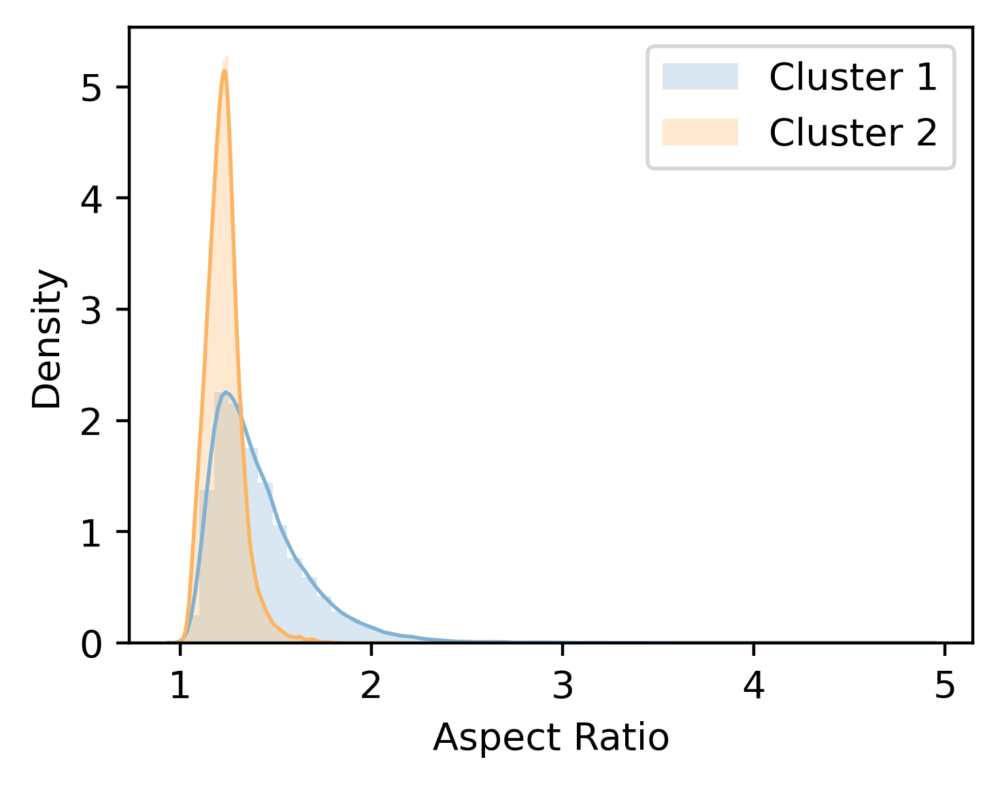

In [23]:
aspect = [prop['aspect_ratio'] for prop in cluster_regprops_list]

plot_cluster_comparison(aspect, 'Aspect Ratio',names)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


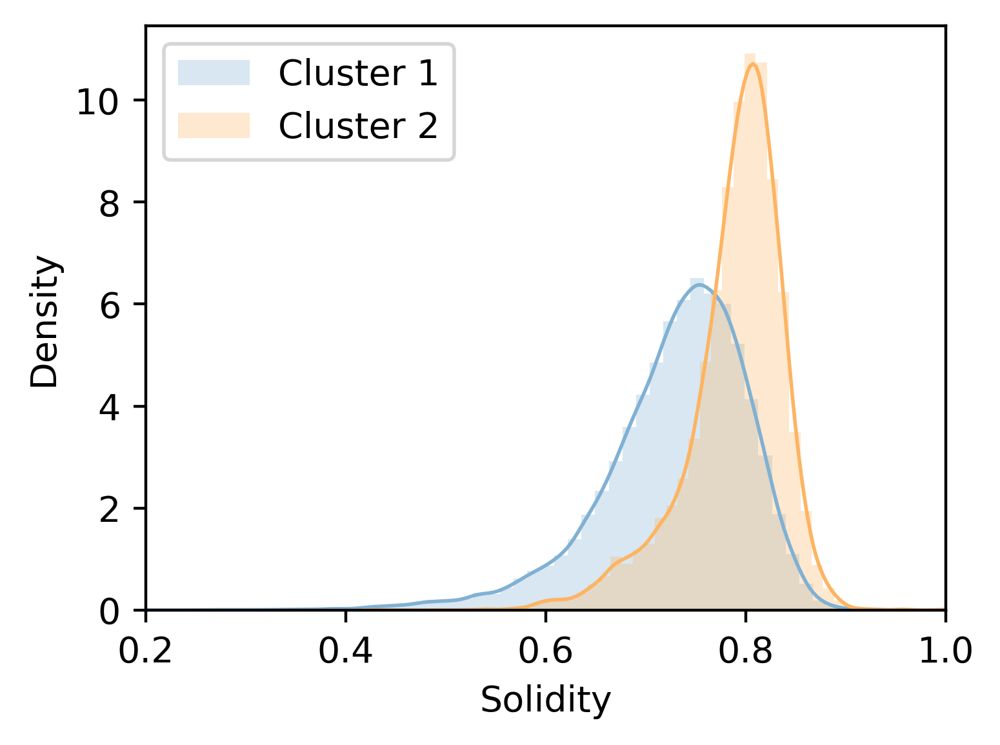

In [24]:
sol = [prop['solidity'] for prop in cluster_regprops_list]

plot_cluster_comparison(sol, 'Solidity',names)
plt.xlim([0.2,1])
plt.savefig('test2.png', dpi =  400, format = 'png')

In [25]:
def make_plots_of_clusters(cluster_props,cluster_names,output_folder):
    cluster_regprops_list =cluster_props

    areas = [prop['area'] for prop in cluster_regprops_list]

    names = cluster_names

    
    plot_cluster_comparison(areas,'Volume [\u03BCm\u00b3]',names)
    plt.savefig(output_folder+'area.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    bbox_area = [prop['bbox_area'] for prop in cluster_regprops_list]
    plot_cluster_comparison(bbox_area, 'Bounding Box Volume [\u03BCm\u00b3]',names)
    plt.savefig(output_folder+'bbox area.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    extent = [prop['extent'] for prop in cluster_regprops_list]
    plot_cluster_comparison(extent, 'Extent',names)
    plt.savefig(output_folder+'extent.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    feret_diam = [prop['feret_diameter_max'] for prop in cluster_regprops_list]
    plot_cluster_comparison(feret_diam, 'Maximum Feret-Diameter [\u03BCm]',names)
    plt.xlim([10,55])
    plt.savefig(output_folder+'feret diameter.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    max_int = [prop['max_intensity'] for prop in cluster_regprops_list]
    plot_cluster_comparison(max_int, 'Maximum Intensity',names)
    plt.savefig(output_folder+'max intensity.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    min_int = [prop['min_intensity'] for prop in cluster_regprops_list]
    plot_cluster_comparison(min_int, 'Minimum Intensity',names)
    plt.savefig(output_folder+'min intensity.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    mean_int = [prop['mean_intensity'] for prop in cluster_regprops_list]
    plot_cluster_comparison(mean_int, 'Mean Intensity',names)
    plt.savefig(output_folder+'mean intensity.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    stdev_int = [prop['image_stdev'] for prop in cluster_regprops_list]
    plot_cluster_comparison(stdev_int, 'Standard Deviation of Intensity',names)
    plt.savefig(output_folder+'stdev intensity.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    distance_cf = 0.69
    cent_0 = [prop['centroid-0']*distance_cf for prop in cluster_regprops_list]
    plot_cluster_comparison(cent_0, 'Location Z [\u03BCm]',names)
    plt.savefig(output_folder+'Location Z.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    cent_1 = [prop['centroid-1']*distance_cf for prop in cluster_regprops_list]
    plot_cluster_comparison(cent_1, 'Location Y [\u03BCm]',names)
    plt.savefig(output_folder+'Location Y.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    cent_2 = [prop['centroid-2']*distance_cf for prop in cluster_regprops_list]
    plot_cluster_comparison(cent_2, 'Location X [\u03BCm]',names)
    plt.xlim([0,550])
    plt.savefig(output_folder+'Location X.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    avg_dist = [prop['avg distance of 6 closest points'] for prop in cluster_regprops_list]
    plot_cluster_comparison(avg_dist, 'Avg. Distance to 6 Neighbours [\u03BCm]',names)
    plt.xlim([5,45])
    plt.savefig(output_folder+'Avg. Distance to 6 Neighbours.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    stdev_dist = [prop['stddev distance of 6 closest points'] for prop in cluster_regprops_list]
    plot_cluster_comparison(stdev_dist, 'Std. Dev. to 6 Neighbours [\u03BCm]',names)
    plt.savefig(output_folder+'stdev Distance to 6 Neighbours.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    tnc = [prop['touching neighbor count'] for prop in cluster_regprops_list]
    plot_cluster_comparison_tnc(tnc, 'Touching Neighbour Count',names, bins = range(31), 
                        kwargs = dict(hist_kws={'alpha':0.3}, 
                                      kde_kws={'linewidth':1, 
                                              'bw':0.2}))
    plt.savefig(output_folder+'touching neighbour count.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    aspect = [prop['aspect_ratio'] for prop in cluster_regprops_list]
    plot_cluster_comparison(aspect, 'Aspect Ratio',names)
    plt.savefig(output_folder+'aspect ratio.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
    sol = [prop['solidity'] for prop in cluster_regprops_list]

    plot_cluster_comparison(sol, 'Solidity',names)
    plt.xlim([0.2,1])
    plt.savefig(output_folder+'solidity.png', dpi =  400, format = 'png', bbox_inches = 'tight')
    plt.close()
    
lund_plot_folder = tc.get_folder_path('lund plots')

make_plots_of_clusters(prediction_df_lund,names,lund_plot_folder)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar 

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar 

In [26]:
wolgast_plot_folder = tc.get_folder_path('wolgast plots')
make_plots_of_clusters(prediction_df_wolgast,names,wolgast_plot_folder)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar 

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar 

In [27]:
make_plots_of_clusters(prediction_df_wolgast,names,wolgast_plot_folder)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar 

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar 

In [28]:
finster_plot_folder = tc.get_folder_path('finster plots')
make_plots_of_clusters(prediction_df_finset,names,finster_plot_folder)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar 

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar 

In [29]:
make_plots_of_clusters(prediction_df_finset,names,finster_plot_folder)

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar 

C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ryans\anaconda3\envs\mstr_v4\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar 